In [109]:
import argparse
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import inv

import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
# from torchvision import utils, datasets, transforms

import time
import scipy
import sys
import os
import shutil
import random

In [110]:
def plot_one_image(img):
    # plt.imshow('image window', img)
    # plt.imshow(img.cpu().data.numpy())
    img = (img - img.min()) / (img.max() - img.min()) * 255
    #print after normalization
    # print(f"After normalizing: {img}")
    img = img.astype('uint8')
    plt.imshow(img, cmap='gray') 
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
# def plot_one_image(img):
#     # plt.imshow('image window', img)
#     # plt.imshow(img.cpu().data.numpy())
#     img = img.astype('uint8')
#     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#     plt.show()

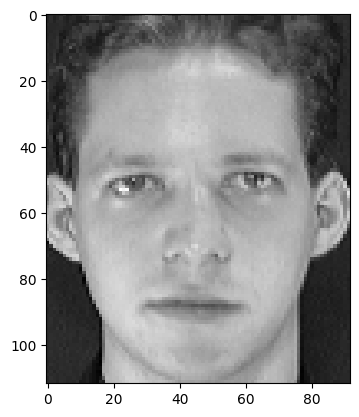

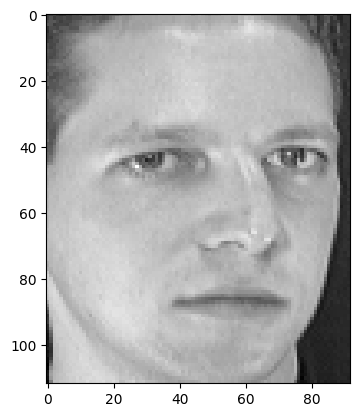

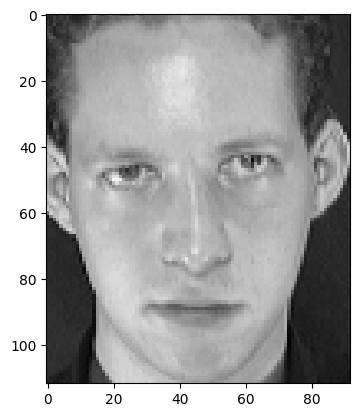

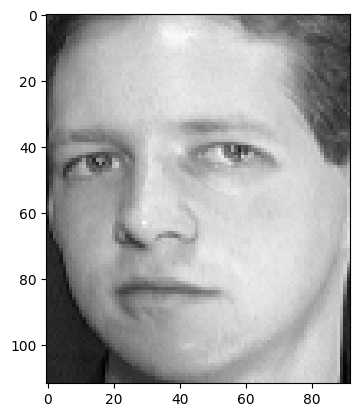

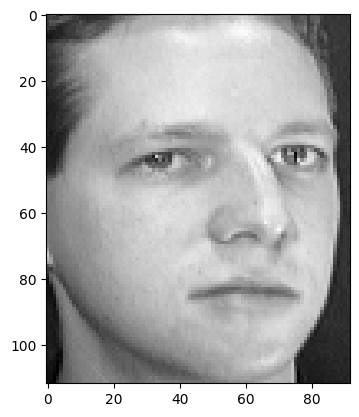

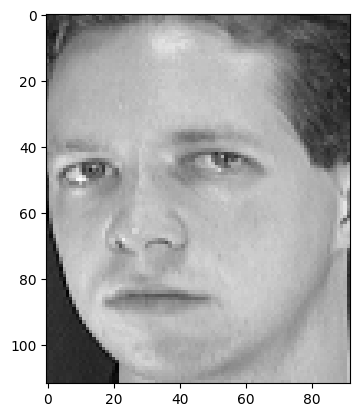

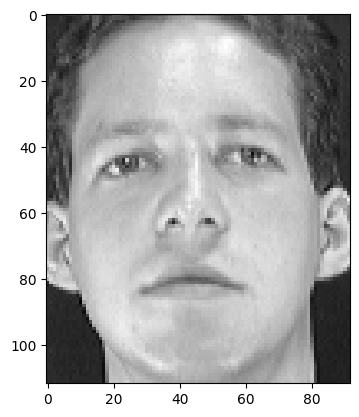

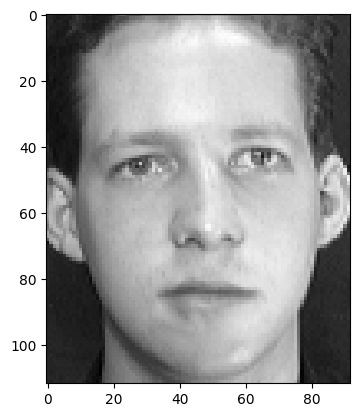

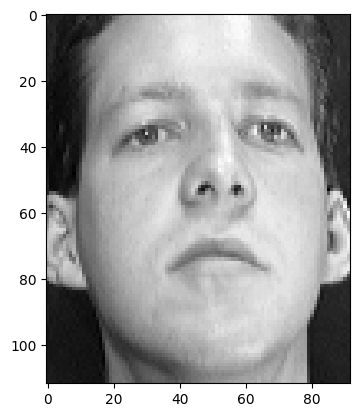

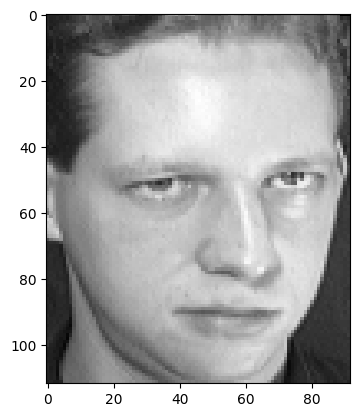

In [111]:
faces_dir_original = './datasets/att_faces'
face_id = 1
ids = range(1, 11)
cur_img = 0
l = 10                                         # training images count
m = 92                                                                      # number of columns of the image
n = 112                                                                     # number of rows of the image
mn = m * n   
L = np.empty(shape=(mn, l), dtype='float64')   
for id in ids:
    path_to_img = os.path.join(faces_dir_original,
            's' + str(face_id), str(id) + '.npy')          # relative path
    # print '> reading file: ' + path_to_img
    img = np.load(path_to_img)
    plot_one_image(img)
    # img = cv2.imread(path_to_img, 0) # read a grayscale image
    img_col = np.array(img, dtype='float64').flatten()              # flatten the 2d image into 1d

    L[:, cur_img] = img_col[:]                                      # set the cur_img-th column to the current training image
    cur_img += 1


In [112]:
#print shape of L
print(f"Shape of L: {L.shape}")

Shape of L: (10304, 10)


In [113]:
#calculate the mean image, return (10304, 1)
mean_image = np.sum(L, axis=1) / l
print(f"Shape of mean_image: {mean_image.shape}")

Shape of mean_image: (10304,)


Shape of mean_image: (112, 92)


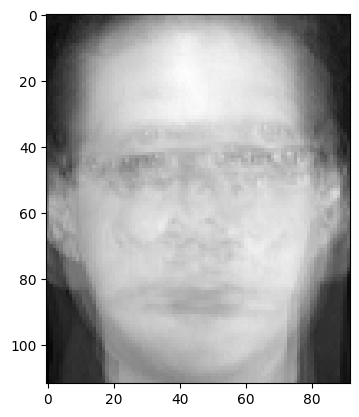

In [114]:
#reshae mean_image to (112, 92)
mean_image = np.reshape(mean_image, (112, 92))
print(f"Shape of mean_image: {mean_image.shape}")
#plot mean_image
plot_one_image(mean_image)

In [115]:
def eval_psnr(outputs, targets):
	'''
	input: (outputs, targets)
	output: PSNR, a scalar value
	'''
	mse2psnr = lambda x: -10. * torch.log(x) / torch.log(torch.tensor([10.], device=x.device))
	mse = ((outputs-targets)**2).mean()
	return mse2psnr(mse).item()

In [116]:
#cal psnr between mean image and each original image
psnr = []
for i in range(l):
    psnr.append(eval_psnr(torch.from_numpy(L[:, i]), torch.from_numpy(mean_image.flatten())))
    print(f"PSNR between mean image and {i}th image: {psnr[i]}")
#print psnr
# print(f"PSNR: {psnr}")

PSNR between mean image and 0th image: -29.858591079711914
PSNR between mean image and 1th image: -31.332786560058594
PSNR between mean image and 2th image: -30.26341438293457
PSNR between mean image and 3th image: -30.058862686157227
PSNR between mean image and 4th image: -28.731395721435547
PSNR between mean image and 5th image: -30.464393615722656
PSNR between mean image and 6th image: -28.303550720214844
PSNR between mean image and 7th image: -29.088226318359375
PSNR between mean image and 8th image: -30.076047897338867
PSNR between mean image and 9th image: -29.795127868652344


(10304, 10)
(10304, 1)


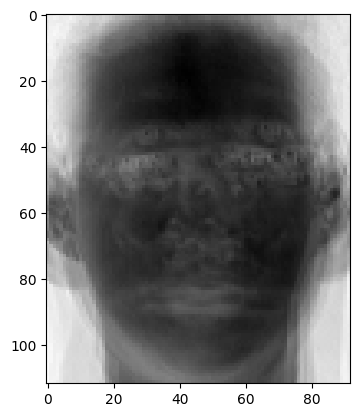

In [117]:
#Try using PCA: from sklearn.decomposition import PCA, one components, and do reconstruction
from sklearn.decomposition import PCA
pca = PCA(n_components=1)
#print(L.shape)
print(L.shape)
pca_result = pca.fit_transform(L)
print(pca_result.shape) 
#print the image of pca_result
img = np.reshape(pca_result, (112, 92))
plot_one_image(img)





(10304, 10)


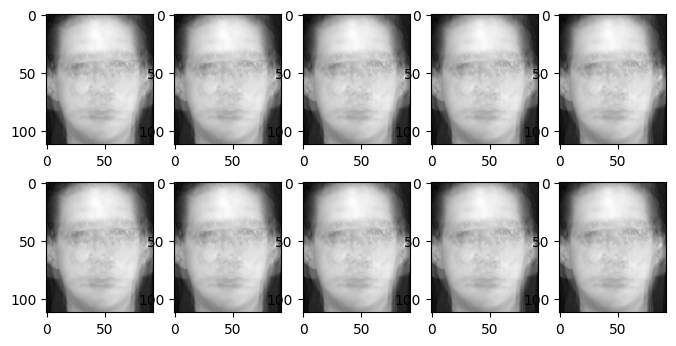

In [118]:
#reconstruct the image
reconstruction_matrix = pca.inverse_transform(pca_result)
print(reconstruction_matrix.shape)
#plot the first 10 reconstructed images
for i in range(10):
    img = reconstruction_matrix[:, i]
    img = np.reshape(img, (112, 92))
    # plot_one_image(img)

#now plot the first 10 reconstructed using subplot and print one figure
fig=plt.figure(figsize=(8, 4))
columns = 5
rows = 2
for i in range(1, columns*rows +1):
    img = reconstruction_matrix[:, i-1]
    img = np.reshape(img, (112, 92))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')

In [119]:
#print the psnr between reconstructed and original
psnr = []
for i in range(l):
    psnr.append(eval_psnr(torch.from_numpy(reconstruction_matrix[:, i]), torch.from_numpy(L[:, i])))
    print(f"PSNR between PCA reconstructed image and {i}th image: {psnr[i]}")

PSNR between PCA reconstructed image and 0th image: -29.41008186340332
PSNR between PCA reconstructed image and 1th image: -30.201196670532227
PSNR between PCA reconstructed image and 2th image: -30.264074325561523
PSNR between PCA reconstructed image and 3th image: -29.881105422973633
PSNR between PCA reconstructed image and 4th image: -28.54802703857422
PSNR between PCA reconstructed image and 5th image: -29.9339542388916
PSNR between PCA reconstructed image and 6th image: -28.37261390686035
PSNR between PCA reconstructed image and 7th image: -27.184206008911133
PSNR between PCA reconstructed image and 8th image: -29.581438064575195
PSNR between PCA reconstructed image and 9th image: -29.54010581970215


In [120]:
#psnr between pca_result and original
psnr = []
for i in range(l):
    psnr.append(eval_psnr(torch.from_numpy(pca_result[i]), torch.from_numpy(L[:, i])))
    print(f"PSNR between PCA encoded image and {i}th image: {psnr[i]}")

PSNR between PCA encoded image and 0th image: -43.83102798461914
PSNR between PCA encoded image and 1th image: -42.08946228027344
PSNR between PCA encoded image and 2th image: -43.695308685302734
PSNR between PCA encoded image and 3th image: -43.6590461730957
PSNR between PCA encoded image and 4th image: -43.2945671081543
PSNR between PCA encoded image and 5th image: -42.457679748535156
PSNR between PCA encoded image and 6th image: -43.49281311035156
PSNR between PCA encoded image and 7th image: -43.858577728271484
PSNR between PCA encoded image and 8th image: -43.11543655395508
PSNR between PCA encoded image and 9th image: -42.997894287109375


# Deep PCA, input is STEMed

In [121]:
def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 0)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value
#create a new STEM, input is (10304, 10), output is (10304, 90), doing convolution with 3*3 kernel for each 10304, namely image
def STEM(inputs, w = 3, channel = 1):
    X = []
    print(f"w = {w}")
    #for 10304, doing 1d convolution
    #print shape[0]
    print(f"inputs.shape[0] = {inputs.shape[0]}")
    print(f"inputs.shape[1] = {inputs.shape[1]}")
    #reshape shape[0] to 112, 92
    inputs = np.reshape(inputs, (112, 92, inputs.shape[1]))
    print(f"inputs.shape = {inputs.shape}")
    for i in range(inputs.shape[2]): #for each image, do 2d convolution, and append the result to X
        #plot the image
        img = inputs[:, :, i]
        y, x = img.shape
        # print(f"img.shape = {img.shape}")
        #add paddings to the img
        padding_width = int(w/2)
        img = np.pad(img, 1, pad_with)
        #print img.shape
        # print(f"img.shape = {img.shape}")
        #for each pixel, do 2d convolution
        imgs_diverse = []
        for j in range(1, y+1):#does not include the  
            for k in range(1, x+1):
                #get the 3*3 kernel
                #using w to get the w*w matrix, for example w = 3, then get 3*3 matrix
                
                kernel = img[j-padding_width:j-padding_width+w, k-padding_width:k-padding_width+w]
                #do 2d convolution
                # reshape kernel to 1d [9, 1]
                kernel = kernel.flatten() # (9,)
                # print(f"kernel.shape = {kernel.shape}")
                #append to X
                imgs_diverse.append(kernel) # (10304, 9)
        #print X shape  
        # print(f"imgs_diverse.shape = {np.array(imgs_diverse).shape}")
        imgs_diverse = np.array(imgs_diverse).T
        #if X is empty
        if len(X) == 0:
            X = np.array(imgs_diverse)
        else:
            X = np.vstack((X, imgs_diverse))
    print(f"X.shape = {X.shape}")
    # # #plot first 9 images in X
    # for i in range(9):
    #     img = X[i, :]
    #     img = np.reshape(img, (112, 92))
    #     plot_one_image(img)
    return X



    


         

    


In [122]:
def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 0)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value
    #test with np.pad
img = np.array([[1, 2, 3], [4, 5, 6]])
img_padded = np.pad(img, 1, pad_with)
print(f"img_padded = \n {img_padded}")
#how to pad top, bottom, left, right with 0 instead

img_padded = 
 [[0 0 0 0 0]
 [0 1 2 3 0]
 [0 4 5 6 0]
 [0 0 0 0 0]]


In [123]:
kernel = 3
stem_input = STEM(torch.Tensor(L),kernel)
# stem_input = STEM(torch.Tensor(L),kernel) #input is the eigenface.L (10304, 240)
# print(f"stem_input.shape = {stem_input.shape}") # (112*92, 1, 3, 3)

w = 3
inputs.shape[0] = 10304
inputs.shape[1] = 10
inputs.shape = torch.Size([112, 92, 10])
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.s

stem_input.shape = (90, 10304)
pca_result.shape = (10304, 1)


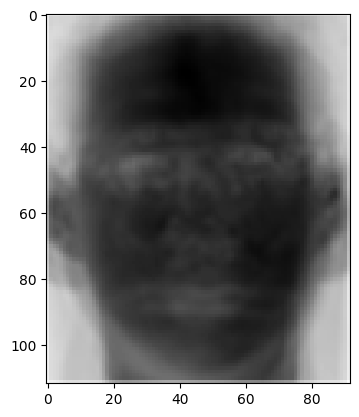

In [124]:

#reshape to (10304,90)
# stem_input = stem_input.reshape(-1, kernel*kernel*l)
print(f"stem_input.shape = {stem_input.shape}") # (90,10304)
stem_input = stem_input.T

#now doing deep PCA with a target Y
pca = PCA(n_components=1)
pca_result = pca.fit_transform(stem_input)

print(f"pca_result.shape = {pca_result.shape}") # (10304, 1)
#plot
img = np.reshape(pca_result, (112, 92))
plot_one_image(img)

#


In [125]:

#reconstruct the image to (10304, 10) using LSE
reconstruction_matrix = pca.inverse_transform(pca_result)
print(reconstruction_matrix.shape)
#plot the first 10 reconstructed images
for i in range(10):
    img = reconstruction_matrix[:, i]
    img = np.reshape(img, (112, 92))
    # plot_one_image(img)



(10304, 90)


In [126]:
#stemed pca_resutl
kernel = 3
decoder_input = STEM(torch.Tensor(pca_result), kernel)
print(f"decoder_input.shape = {decoder_input.shape}") # (9,10304)

w = 3
inputs.shape[0] = 10304
inputs.shape[1] = 1
inputs.shape = torch.Size([112, 92, 1])
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.sha

In [127]:
#using LSE to reconstruct from (9,10304) to (10,10304), so w will be [9X10]
def LSE(input, output):
  stem = input
  print(f"stem.shape = {stem.shape}") # [2472960, 1]
  targets = output.float() # [batch, 3, H, W] -> [batchxHxW, 3]
  print(f"targets.shape = {targets.shape}") #[2472960, 1]

  kernel_weights = torch.matmul(torch.inverse(torch.matmul(stem.t(),stem)+1e-3*torch.eye(stem.shape[-1])),
            torch.matmul(stem.t(), targets)) # "Tikhonov regularization" or "ridge regression" 
  return kernel_weights.t()

#L: (10304, 10)
decoder_input = decoder_input.T
print(f"decoder_input.shape = {decoder_input.shape}") # (9,10304)
decoder_weights = LSE(torch.Tensor(decoder_input), torch.Tensor(L))

decoder_input.shape = (10304, 9)
stem.shape = torch.Size([10304, 9])
targets.shape = torch.Size([10304, 10])


In [128]:
print(f"decoder_weights.shape = {decoder_weights.shape}") # (10, 10304)

decoder_weights.shape = torch.Size([10, 9])


In [129]:
#reconstruct using decoder_weights
decoder_input = torch.Tensor(decoder_input)
reconstruction_matrix = torch.matmul(decoder_weights, decoder_input.T)
print(f"reconstruction_matrix.shape = {reconstruction_matrix.shape}") # (10, 10304)

reconstruction_matrix.shape = torch.Size([10, 10304])


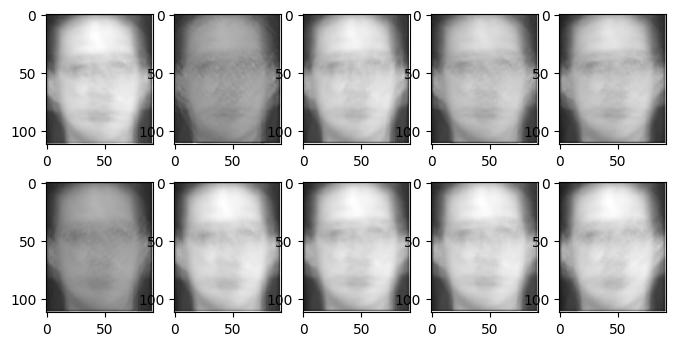

In [130]:
#plot all reconstructed images
for i in range(10):
    img = reconstruction_matrix[i, :]
    img = np.reshape(img, (112, 92))
    img = img.cpu().data.numpy()
    # plot_one_image(img)
#now print using subplot to print one figure
fig=plt.figure(figsize=(8, 4))
columns = 5
rows = 2
for i in range(1, columns*rows +1):
    img = reconstruction_matrix[i-1, :]
    img = np.reshape(img, (112, 92))
    img = img.cpu().data.numpy()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')

In [131]:
#now compare psnr between original image and reconstructed image
#first, calculate mse
#psnr between deep pca reconstructed and original
psnr = []
for i in range(l):
    psnr.append(eval_psnr(reconstruction_matrix[i, :], torch.from_numpy(L[:, i])))
    print(f"PSNR between deep PCA reconstructed image and {i}th image: {psnr[i]}")

PSNR between deep PCA reconstructed image and 0th image: -42.23514175415039
PSNR between deep PCA reconstructed image and 1th image: -43.514678955078125
PSNR between deep PCA reconstructed image and 2th image: -42.549720764160156
PSNR between deep PCA reconstructed image and 3th image: -43.14200210571289
PSNR between deep PCA reconstructed image and 4th image: -43.11463165283203
PSNR between deep PCA reconstructed image and 5th image: -43.218238830566406
PSNR between deep PCA reconstructed image and 6th image: -42.593894958496094
PSNR between deep PCA reconstructed image and 7th image: -42.13272476196289
PSNR between deep PCA reconstructed image and 8th image: -42.604618072509766
PSNR between deep PCA reconstructed image and 9th image: -42.54249954223633


In [132]:
#compare psnr between deep pca encoded result and original
psnr = []
for i in range(l):
    psnr.append(eval_psnr(torch.from_numpy(pca_result[i]), torch.from_numpy(L[:, i])))
    print(f"PSNR between deep PCA encoded image and {i}th image: {psnr[i]}")

PSNR between deep PCA encoded image and 0th image: -59.41199493408203
PSNR between deep PCA encoded image and 1th image: -58.28737258911133
PSNR between deep PCA encoded image and 2th image: -58.50416946411133
PSNR between deep PCA encoded image and 3th image: -58.419551849365234
PSNR between deep PCA encoded image and 4th image: -58.3438720703125
PSNR between deep PCA encoded image and 5th image: -58.280460357666016
PSNR between deep PCA encoded image and 6th image: -58.409481048583984
PSNR between deep PCA encoded image and 7th image: -58.458457946777344
PSNR between deep PCA encoded image and 8th image: -58.29563903808594
PSNR between deep PCA encoded image and 9th image: -58.101219177246094


# test w = 1

In [133]:
#test with kernel = 1, for deepPCA, which should has the same result as PCA
kernel = 1
stem_input = STEM(torch.Tensor(L),kernel)
#print shape
print(f"stem_input.shape = {stem_input.shape}") # (10304, 1, 1, 1)
#now do 

w = 1
inputs.shape[0] = 10304
inputs.shape[1] = 10
inputs.shape = torch.Size([112, 92, 10])
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.s

# Real Deep PCA

Encoder: 
Y.shape = torch.Size([10304, 10])
X.shape = torch.Size([10304, 10])
w = 3
inputs.shape[0] = 10304
inputs.shape[1] = 10
inputs.shape = torch.Size([112, 92, 10])
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.sha

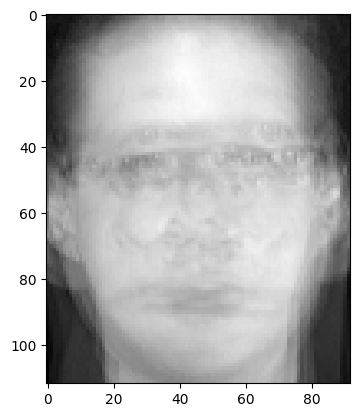

PSNR between RCA-DPCA encoded image and 0th image: -50.25695037841797
PSNR between RCA-DPCA encoded image and 1th image: -49.908504486083984
PSNR between RCA-DPCA encoded image and 2th image: -50.17289352416992
PSNR between RCA-DPCA encoded image and 3th image: -49.9621696472168
PSNR between RCA-DPCA encoded image and 4th image: -49.899330139160156
PSNR between RCA-DPCA encoded image and 5th image: -49.997920989990234
PSNR between RCA-DPCA encoded image and 6th image: -50.10399627685547
PSNR between RCA-DPCA encoded image and 7th image: -50.19675064086914
PSNR between RCA-DPCA encoded image and 8th image: -50.09628677368164
PSNR between RCA-DPCA encoded image and 9th image: -50.15958786010742


In [134]:
#X is original images (10304, 10)
print("Encoder: ")
L = torch.Tensor(L)
m = 1
w = 3

X = L
Y = X
print(f"Y.shape = {Y.shape}") # (10304, 10)
print(f"X.shape = {X.shape}") # (10304, 10)
w = 3
DkX = STEM(torch.Tensor(X), w)
DkX = torch.Tensor(DkX)
print(f"DkX.shape = {DkX.shape}") # (9, 10)
XYt = torch.mm(DkX, Y)
print(f"XYt.shape = {XYt.shape}") # (10304, 10304)
XXt = torch.mm(DkX, DkX.T)
print(f"XXt.shape = {XXt.shape}") # (10304, 10304)

RM = torch.mm(torch.inverse(torch.mm(DkX, DkX.t())+1e-3*torch.eye(DkX.shape[0])),torch.mm(XYt, XYt.t()))
print(f"RM.shape = {RM.shape}") # (90, 90)
#now calculate DM
# DM =  torch.mm(torch.inverse(torch.mm(DkX, DkX.t())+1e-3*torch.eye(DkX.shape[0])),XYt)
# print(f"DM.shape = {DM.shape}") # (90, 10304)
#do torch.svd on DM




eigenvalues, eigenvectors = torch.linalg.eig(RM)
values, indices = torch.sort(eigenvalues.real, descending=True)
U = (eigenvectors[:, indices[:m]]).t().real  #(m,27)
print(f"U.shape = {U.shape}") # (10, 90)
# #print m
print(f"m = {m}")
print(f"U.shape = {U.shape}") # (90, 90)
UX = torch.mm(U,DkX) #(10,10304)
print(f"UX.shape = {UX.shape}") # (10, 90)
# F = torch.mm(torch.mm(Y, UX.t()),torch.inverse(torch.mm(UX, UX.t())+1e-3*torch.eye(UX.shape[0])),)
F = torch.mm(torch.mm(Y.T, UX.t()),
                 torch.inverse(torch.mm(UX, UX.t())+1e-3*torch.eye(UX.shape[0])),
			        )
print(f"F.shape = {F.shape}") # (10, 10)
reconstructed_y = UX
print(f"reconstructed_y.shape = {reconstructed_y.shape}") # (1, 10304)

#plot reconstructed_y
#convert to numpy
reconstructed_y = reconstructed_y.cpu().data.numpy()
#reshape and plot
plot_one_image(np.reshape(reconstructed_y, (112, 92)))

#print psnr of reconstructed_y and 10 original images
psnr = []
for i in range(l):
    psnr.append(eval_psnr(torch.from_numpy(reconstructed_y), L[:, i]))
    print(f"PSNR between RCA-DPCA encoded image and {i}th image: {psnr[i]}")


Decoder: 
X.shape = torch.Size([10304, 10])
reconstructed_y.shape = (1, 10304)
w = 3
inputs.shape[0] = 10304
inputs.shape[1] = 1
inputs.shape = torch.Size([112, 92, 1])
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shape = (9,)
kernel.shap

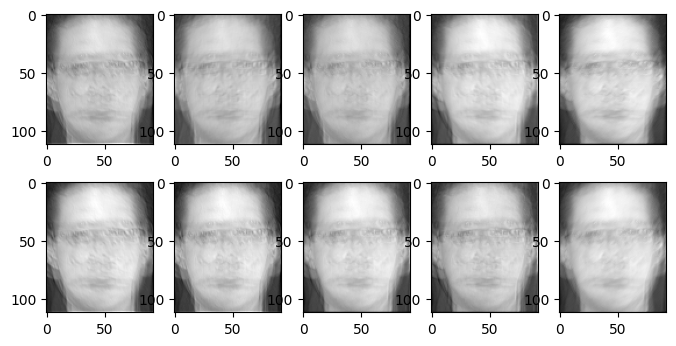

In [135]:
#then decoder
#stem the reconstructed_y
print("Decoder: ")
w = 3
#X is original images (10304, 10)
X = L
print(f"X.shape = {X.shape}") # (10304, 10)
print(f"reconstructed_y.shape = {reconstructed_y.shape}") # (10304, 10)
Dky = STEM(torch.Tensor(reconstructed_y).T, w)
print(f"Dky.shape = {Dky.shape}") # (90, 10304)
#using LSE to find P
P = LSE(torch.Tensor(Dky).T, torch.Tensor(X))
print(f"P.shape = {P.shape}") # (10, 10304)
#reconstruct using P
reconstructed_x = torch.mm(torch.Tensor(P), torch.Tensor(Dky))
print(f"reconstructed_x.shape = {reconstructed_x.shape}") # (10, 10304)
#plot reconstructed_x to one figure using sub plot
fig=plt.figure(figsize=(8, 4))
columns = 5
rows = 2
for i in range(1, columns*rows +1):
    img = reconstructed_x[i-1, :]
    img = np.reshape(img, (112, 92))
    img = img.cpu().data.numpy()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')
#calculate psnr between reconstructed_x and original
psnr = []
for i in range(l):
    img = reconstructed_x[i, :].cpu().data.numpy()
    psnr.append(eval_psnr(torch.from_numpy(img), L[:, i])) #torch.from_numpy(L[:, i])
    print(f"PSNR between deep PCA reconstructed X and {i}th image: {psnr[i]}")


#  w=1


Encoder: 
Y.shape = torch.Size([10304, 10])
X.shape = torch.Size([10304, 10])
w = 1
inputs.shape[0] = 10304
inputs.shape[1] = 10
inputs.shape = torch.Size([112, 92, 10])
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.sha

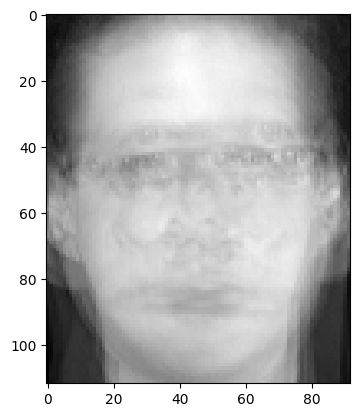

PSNR between RCA-DPCA encoded image and 0th image: -49.99925994873047
PSNR between RCA-DPCA encoded image and 1th image: -49.6402702331543
PSNR between RCA-DPCA encoded image and 2th image: -49.91267395019531
PSNR between RCA-DPCA encoded image and 3th image: -49.69548416137695
PSNR between RCA-DPCA encoded image and 4th image: -49.630126953125
PSNR between RCA-DPCA encoded image and 5th image: -49.73242950439453
PSNR between RCA-DPCA encoded image and 6th image: -49.84122085571289
PSNR between RCA-DPCA encoded image and 7th image: -49.93696975708008
PSNR between RCA-DPCA encoded image and 8th image: -49.83368682861328
PSNR between RCA-DPCA encoded image and 9th image: -49.898780822753906


In [137]:
#X is original images (10304, 10)
print("Encoder: ")
L = torch.Tensor(L)
m = 1


X = L
Y = X
print(f"Y.shape = {Y.shape}") # (10304, 10)
print(f"X.shape = {X.shape}") # (10304, 10)
w = 3
DkX = STEM(torch.Tensor(X), 1)
DkX = torch.Tensor(DkX)
print(f"DkX.shape = {DkX.shape}") # (9, 10)
XYt = torch.mm(DkX, Y)
print(f"XYt.shape = {XYt.shape}") # (10304, 10304)
XXt = torch.mm(DkX, DkX.T)
print(f"XXt.shape = {XXt.shape}") # (10304, 10304)

RM = torch.mm(torch.inverse(torch.mm(DkX, DkX.t())+1e-3*torch.eye(DkX.shape[0])),torch.mm(XYt, XYt.t()))
print(f"RM.shape = {RM.shape}") # (90, 90)
#now calculate DM
# DM =  torch.mm(torch.inverse(torch.mm(DkX, DkX.t())+1e-3*torch.eye(DkX.shape[0])),XYt)
# print(f"DM.shape = {DM.shape}") # (90, 10304)
#do torch.svd on DM




eigenvalues, eigenvectors = torch.linalg.eig(RM)
values, indices = torch.sort(eigenvalues.real, descending=True)
U = (eigenvectors[:, indices[:m]]).t().real  #(m,27)
print(f"U.shape = {U.shape}") # (10, 90)
# #print m
print(f"m = {m}")
print(f"U.shape = {U.shape}") # (90, 90)
UX = torch.mm(U,DkX) #(10,10304)
print(f"UX.shape = {UX.shape}") # (10, 90)
# F = torch.mm(torch.mm(Y, UX.t()),torch.inverse(torch.mm(UX, UX.t())+1e-3*torch.eye(UX.shape[0])),)
F = torch.mm(torch.mm(Y.T, UX.t()),
                 torch.inverse(torch.mm(UX, UX.t())+1e-3*torch.eye(UX.shape[0])),
			        )
print(f"F.shape = {F.shape}") # (10, 10)
reconstructed_y = UX
print(f"reconstructed_y.shape = {reconstructed_y.shape}") # (1, 10304)

#plot reconstructed_y
#convert to numpy
reconstructed_y = reconstructed_y.cpu().data.numpy()
#reshape and plot
plot_one_image(np.reshape(reconstructed_y, (112, 92)))

#print psnr of reconstructed_y and 10 original images
psnr = []
for i in range(l):
    psnr.append(eval_psnr(torch.from_numpy(reconstructed_y), L[:, i]))
    print(f"PSNR between RCA-DPCA encoded image and {i}th image: {psnr[i]}")


In [142]:
#then decoder
#stem the reconstructed_y
print("Decoder: ")
w = 1
#X is original images (10304, 10)
X = L
print(f"X.shape = {X.shape}") # (10304, 10)
print(f"reconstructed_y.shape = {reconstructed_y.shape}") # (10304, 10)
Dky = STEM(torch.Tensor(reconstructed_y).T, 1)
print(f"Dky.shape = {Dky.shape}") # (90, 10304)
#using LSE to find P
P = LSE(torch.Tensor(Dky).T, torch.Tensor(X))
print(f"P.shape = {P.shape}") # (10, 10304)
#reconstruct using P
reconstructed_x = torch.mm(torch.Tensor(P), torch.Tensor(Dky))
print(f"reconstructed_x.shape = {reconstructed_x.shape}") # (10, 10304)




Decoder: 
X.shape = torch.Size([10304, 10])
reconstructed_y.shape = (1, 10304)
w = 1
inputs.shape[0] = 10304
inputs.shape[1] = 1
inputs.shape = torch.Size([112, 92, 1])
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shape = (1,)
kernel.shap

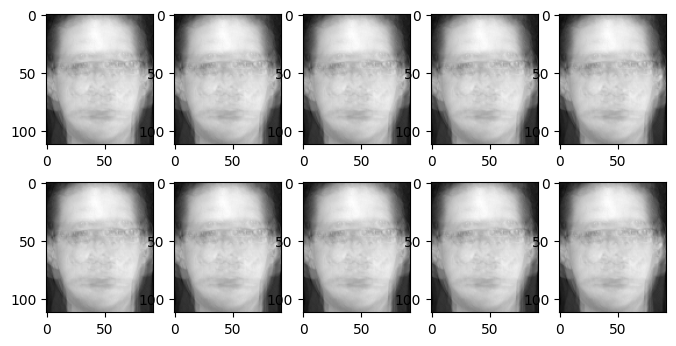

In [140]:
#plot reconstructed_x to one figure using sub plot
fig=plt.figure(figsize=(8, 4))
columns = 5
rows = 2
for i in range(1, columns*rows +1):
    img = reconstructed_x[i-1, :]
    img = np.reshape(img, (112, 92))
    img = img.cpu().data.numpy()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')

In [141]:
#calculate psnr between reconstructed_x and original
psnr = []
for i in range(l):
    img = reconstructed_x[i, :].cpu().data.numpy()
    psnr.append(eval_psnr(torch.from_numpy(img), L[:, i])) #torch.from_numpy(L[:, i])
    print(f"PSNR between deep PCA reconstructed X and {i}th image: {psnr[i]}")

PSNR between deep PCA reconstructed X and 0th image: -29.727333068847656
PSNR between deep PCA reconstructed X and 1th image: -31.1339054107666
PSNR between deep PCA reconstructed X and 2th image: -30.256181716918945
PSNR between deep PCA reconstructed X and 3th image: -29.942068099975586
PSNR between deep PCA reconstructed X and 4th image: -28.44218635559082
PSNR between deep PCA reconstructed X and 5th image: -30.391183853149414
PSNR between deep PCA reconstructed X and 6th image: -28.31348991394043
PSNR between deep PCA reconstructed X and 7th image: -29.02685546875
PSNR between deep PCA reconstructed X and 8th image: -30.075031280517578
PSNR between deep PCA reconstructed X and 9th image: -29.776065826416016
